# CS 5670: Computer Vision   --  Home Work 5 
## Naveen (nlp49), Yanbo (yl2556)  
   
   
## Task 2: Object Detection in Images
### Abstract
In this part of the assignment, we do object (logo) detection in images. 

**a. The motivation to the method you propose.**  
The task we have is essentially matching a template with occurrences in real images. More specifically, this can be sub-categorized as a logo detection problem. This essentially means we have a template image whose occurrences in scene images are not guaranteed to be a reproduction of the template, but a different re-rendering in each of the scene images.  
      
There are 2 approaches we can consider to doing this. One is a machine learning method where we have a large set of positive and negative samples, use HOG descriptors and attempt to determine if the image has the logo, and if so, at which points in the scene image it occurs. This is a relatively difficult task owing to the lack of training and test samples. Also, we were unable to obtain any figures on the accuracy of this method vs the alternative.

The alternative, which is the method we used, is based on the ideas from the following paper. We basically perform SIFT detection, match using RANSAC and identify ocurrences of the template image  
"A method of TV Logo Recognition based on SIFT - Atlantis Press, D Pan"  
http://www.atlantis-press.com/php/download_paper.php?id=10544  

**b. The guiding principles of your approach.**  
In this method, we basically perform the following steps:-  
1. Find SIFT keypoints on the template and scene images  
2. Match them using a Brute Force matcher (since efficiency is not critical)  
3. Identify viable matches using Lowe's ratio test  
4. Use these good matches and compute a Homography matrix using RANSAC  
5. Threshold based on factors like RANSAC reprojection threshold distance (we use 2), number of matches after RANSAC (minimum 7 matches), area under the polygon (< 100 sq px) etc.. to remove erroneous matching  
6. Use the homography to identify the bounding box for the logo occurrence
7. Occlude the original area of logo occurrence with a black polygon and repeat from step 1 until the resulting matches from RANSAC are too few (<7) or the polygons indicate an incorrect solution (area of polygon < 100 sq px)  

**c. In what cases do you expect it to succeed or fail?**  
We expect it to succeed in images where the scene image has a fairly good representation of the original image.  

The method is not robust to the following scenarios:  

1. Bad lighting conditions in the scene image  
eg. Starbucks images 1,6,14  
 
2. Bad color or texture representation in the scene image  
eg. Superman images 3,5  

However, the method does work for the following cases:  
1. Easy to detect multiple occurrences of templates  
eg. Starbucks images 3,4,8 and Roadsign images 7,9  

2. It can successfully handle occlusions  
eg. Roadsign images 1,2,9  

3. Variable sizes of template occurrences across and within scene images  
eg. Starbucks images 4,8  

**d. What are the advantages and disadvantages of your approach?**  
Using SIFT+RANSAC has a lot of advantages.  
1. It is easy to perform multiple detections within the same image  
2. It is easy to determine the bounding boxes using a homographic transformation  
3. It can handle occlusions easily  
3. And most critically, we can perform direct template matching without the need for any training data. Also, from our research, we found that the method was fairly accurate and could identify logos consistenly for various logos under different conditions.  
Ref: http://cs.uccs.edu/~gsc/pub/master/yalsahaf/doc/YousefAlsahafiReport.pdf  

However, there are also some disadvantages.  
1. It is prone to color differences, as can be seen in the Superman set. It might be possible to use something like CSIFT to achieve color independence, but this wasn't explored in the assignment  
2. It cannot templates identify in bad lighting conditions  
3. It doesn't make use of shape information or color information (as it converts to grayscale in our implementation)  

In [2]:
%matplotlib inline
# http://www.pyimagesearch.com/2015/04/13/implementing-rootsift-in-python-and-opencv/
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [366]:
def disp(img, h=10, w=20, title=[]):
    plt.figure(figsize=(w,h))
    if(len(title)>0):
        plt.title(title)
    plt.imshow(img, cmap=cm.gray)

def polygon_area(corners):
    n = len(corners) # of corners
    area = 0.0
    for i in range(n):
        j = (i + 1) % n
        area += corners[i][0][0] * corners[j][0][1]
        area -= corners[j][0][0] * corners[i][0][1]
    area = abs(area) / 2.0
    return area

In [60]:
sift = cv2.SIFT()
bf = cv2.BFMatcher()

In [487]:
def display_matches(fileset, start, end):
    # first we read in the logo
    logo1 = cv2.imread("./Images/Q2/"+fileset+"/template.jpg",0)
    
    kp1, des1 = sift.detectAndCompute(logo1,None)
    logo1c = cv2.drawKeypoints(logo1,kp1,color=[255,0,0])
    h,w = logo1.shape
    
    for i in np.arange(start,end):
        # read in grayscale to do sift analysis
        img = cv2.imread("./Images/Q2/"+fileset+"/image"+str(i)+".jpg",0)
        # read in a color version of image
        imgc = cv2.cvtColor(cv2.imread("./Images/Q2/"+fileset+"/image"+str(i)+".jpg"), cv2.COLOR_BGR2RGB)
        
        # loop until all logos are identified
        ctr = 1
        while(ctr<6):
            kp, des = sift.detectAndCompute(img,None)
            matches = bf.knnMatch(des1,des,2)

            # lowe's ratio test
            good = []
            for m,n in matches:
                if m.distance < 0.8*n.distance:
                    good.append(m)
                    
            if(len(good)<14):
                break       
            
            
            pts1 = []
            pts2 = []

            for idx,m in enumerate(good):
                pts2.append(kp[m.trainIdx].pt)
                pts1.append(kp1[m.queryIdx].pt)

            pts1 = np.float32(pts1)
            pts2 = np.float32(pts2)

            # use ransac to find homography and inliers, outliers
            M, mask = cv2.findHomography(pts1,pts2,cv2.FM_RANSAC,ransacReprojThreshold=2)
            
            # draw the green bounding box and good keypoints
            pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
            dst = cv2.perspectiveTransform(pts,M)
            if polygon_area(dst) < 100:
                cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)
                ctr = ctr + 1
                continue
            
            good_pts = [kp[g.trainIdx] for g in np.array(good)[mask.ravel()==1]] 
            if(len(good_pts)<7):
                cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)
                ctr = ctr + 1
                break
            # print polygon_area(dst)
            cv2.polylines(imgc,[np.int32(dst)],True,[0,255,0],4)
            imgc = cv2.drawKeypoints(imgc,good_pts,color=[0,0,255])
            
            # fill in image with black rectangle
            cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)

            # we then store only outlier points for the next iteration
            ctr = ctr + 1
            
        disp(imgc,4,8,"Detection for Image"+str(i))

            


### Results

We use the display_matches method for the 3 sets of images. We find that the detection is fairly accurate for the Roadsign image set and the Starbucks image set.  

We have some poor detections in the Starbucks image set owing to bad lighting in some of the images. eg. Starbucks images 1,6,14  

We also have some false detections in all 3 image sets. eg. Roadsign image 7 and Starbucks image 6. This occcurs due to the RANSAC algorithm producing erroneous matches in other parts of the image outside the template area. This occurs despite fairly stringent matching criteria being used.

Finally, we note that the results are extremely bad for the Superman set. This is primarily because the representations in the Superman set are different in terms of color and texture.

**CONS:**  

1. Bad lighting conditions in the scene image  
Starbucks images 1,6,14 failed as expected  
 
2. Bad color or texture representation in the scene image  
All Superman images failed as expected  

**PROS**  
1. Easy to detect multiple occurrences of templates  
Starbucks images 3,4 and Roadsign images 9 were successfully detected  
However, Roadsign image 7 and Starbucks image 8 were partially successful  

2. It can successfully handle occlusions  
Roadsign images 1,2,9 were all successfully detected  

3. Variable sizes of template occurrences across and within scene images  
Starbucks images 3, 4 and 8 indicate this method can detect multiple templates of different sizes even within the same image  

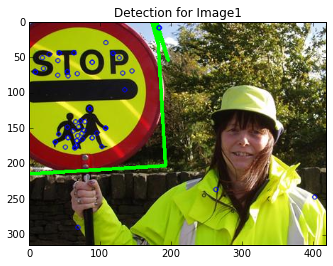

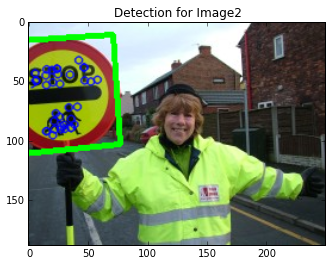

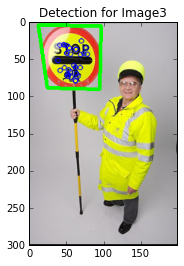

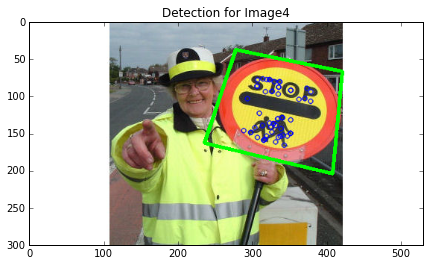

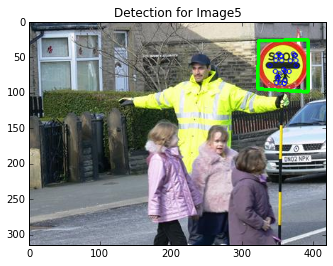

...

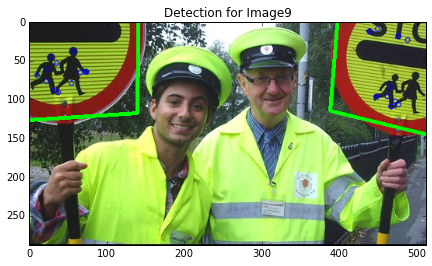

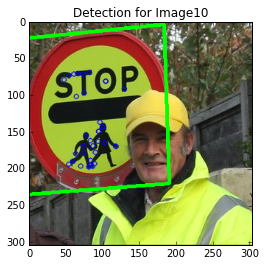

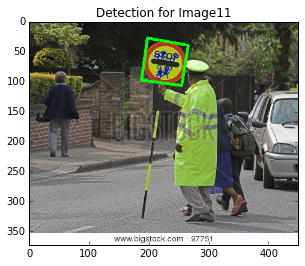

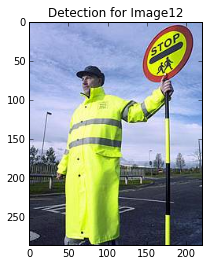

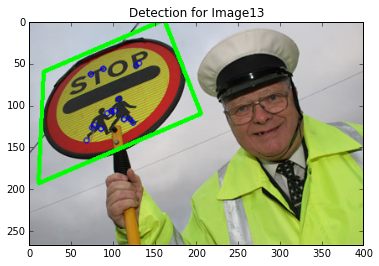

In [482]:
display_matches("Roadsign", 1, 14)

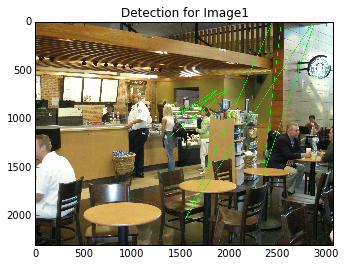

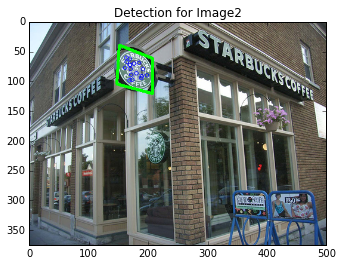

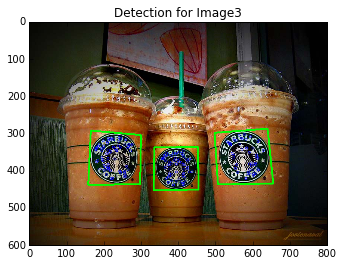

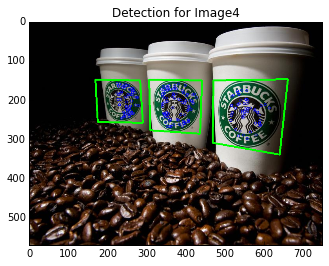

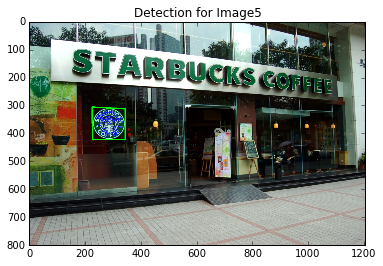

...

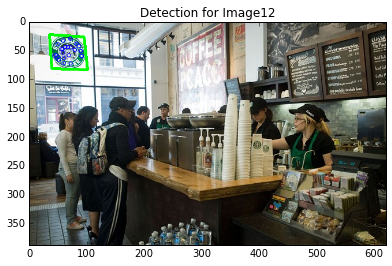

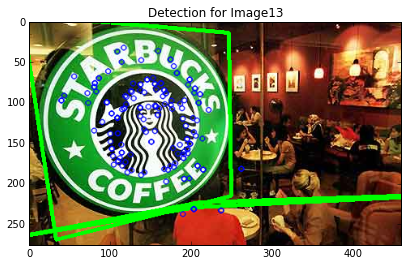

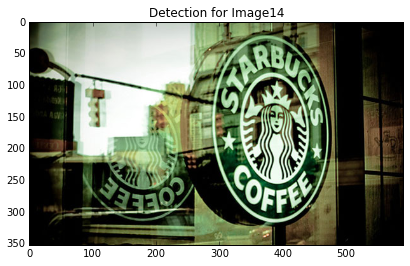

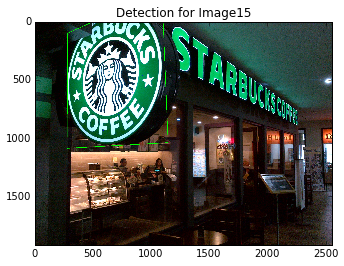

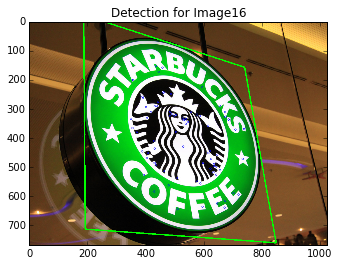

In [462]:
display_matches("Starbucks", 1, 17)

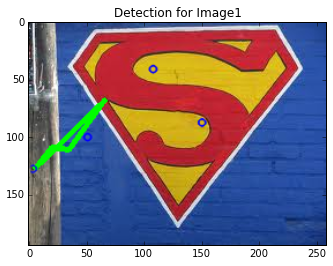

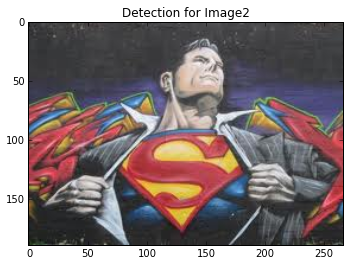

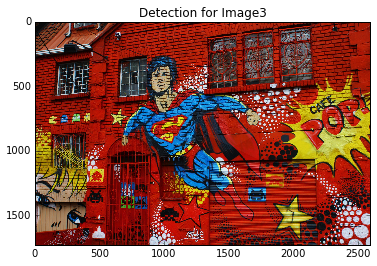

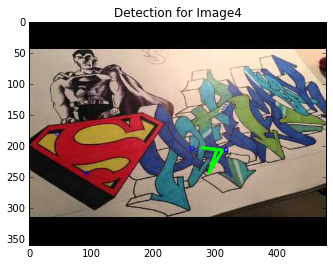

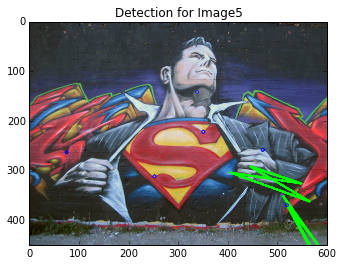

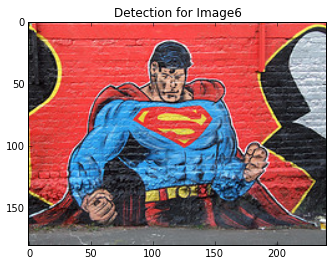

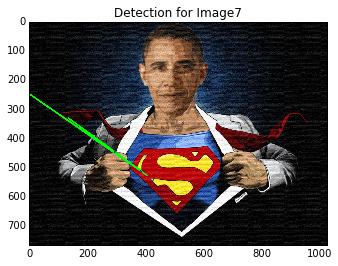

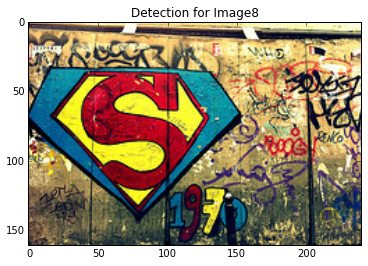

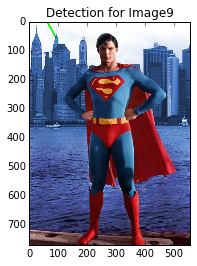

In [488]:
display_matches("Superman", 1, 10)

### Addressing Failure Modes and Improving Algorithm

One of the observed failure modes is Roadsign image 7. The reason why we get the bounding box for the left stop sign as completely warped is because 1 of the points used to calculate the homography is outside the actual stop sign. To avoid this, we can calculate the distance between each points in the inliers. For points whose nearest point is greater than a threshold distance (obtained from minimum distance between points), we can discard that inlier point and recompute homography.

**We then extend this method to other images and find that it significantly improves results by removing noisy detections for the Roadsign and the Starbucks tasks. Additionally, we find additional detections in the case of Starbucks image 8. However, the results were similarly poor for the Superman image set**

In [564]:
from scipy.spatial import distance

def cleanup_inliers(inlier_pts1, inlier_pts2):
    totaldistance = 0
    n = len(inlier_pts2)
    mindistances = []
    for i in range(n):
        mindistance = 10000000
        first_pt = inlier_pts2[i]
        for j in range(i+1,n):
            dst = distance.euclidean(first_pt,inlier_pts2[j])
            if(dst<mindistance):
                mindistance = dst
            totaldistance = totaldistance + dst
        mindistances.append(mindistance)
    meandistance = totaldistance/n
    
    new_inlier_pts1 = []
    new_inlier_pts2 = []
    for i in range(n):
        if(mindistances[i]<(0.8*meandistance)):
            new_inlier_pts1.append(inlier_pts1[i])
            new_inlier_pts2.append(inlier_pts2[i])
    
    return np.array(new_inlier_pts1), np.array(new_inlier_pts2)

def display_matches2(fileset, start, end):
    # first we read in the logo
    logo1 = cv2.imread("./Images/Q2/"+fileset+"/template.jpg",0)
    
    kp1, des1 = sift.detectAndCompute(logo1,None)
    logo1c = cv2.drawKeypoints(logo1,kp1,color=[255,0,0])
    h,w = logo1.shape
    
    for i in np.arange(start,end):
        # read in grayscale to do sift analysis
        img = cv2.imread("./Images/Q2/"+fileset+"/image"+str(i)+".jpg",0)
        # read in a color version of image
        imgc = cv2.cvtColor(cv2.imread("./Images/Q2/"+fileset+"/image"+str(i)+".jpg"), cv2.COLOR_BGR2RGB)
        
        # loop until all logos are identified
        ctr = 1
        while(ctr<6):
            kp, des = sift.detectAndCompute(img,None)
            matches = bf.knnMatch(des1,des,2)

            # lowe's ratio test
            good = []
            for m,n in matches:
                if m.distance < 0.8*n.distance:
                    good.append(m)
                    
            if(len(good)<14):
                break       
            
            
            pts1 = []
            pts2 = []

            for idx,m in enumerate(good):
                pts2.append(kp[m.trainIdx].pt)
                pts1.append(kp1[m.queryIdx].pt)

            pts1 = np.float32(pts1)
            pts2 = np.float32(pts2)

            # use ransac to find homography and inliers, outliers
            M, mask = cv2.findHomography(pts1,pts2,cv2.FM_RANSAC,ransacReprojThreshold=2)
            inlier_pts1 = pts1[mask.ravel()==1]
            inlier_pts2 = pts2[mask.ravel()==1]
            inlier_pts1_new, inlier_pts2_new = cleanup_inliers(inlier_pts1, inlier_pts2)
            if(len(inlier_pts2_new)<4):
                pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
                dst = cv2.perspectiveTransform(pts,M)
                cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)
                ctr = ctr + 1
                break
            M, mask = cv2.findHomography(inlier_pts1_new,inlier_pts2_new,0)
            
            # draw the green bounding box and good keypoints
            pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
            dst = cv2.perspectiveTransform(pts,M)
            if polygon_area(dst) < 100:
                cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)
                ctr = ctr + 1
                continue
            
            good_pts = [kp[g.trainIdx] for g in np.array(good)[mask.ravel()==1]]
            if(len(good_pts)<4):
                cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)
                ctr = ctr + 1
                break
            cv2.polylines(imgc,[np.int32(dst)],True,[0,255,0],4)
            imgc = cv2.drawKeypoints(imgc,good_pts,color=[0,0,255])
            
            # fill in image with black rectangle
            cv2.fillConvexPoly(img, np.array(np.int32(dst)), 0)

            # we then store only outlier points for the next iteration
            ctr = ctr + 1
            
        disp(imgc,4,8,"Detection for Image"+str(i))

            


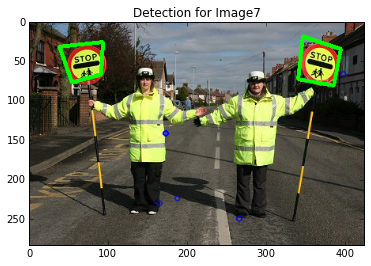

In [559]:
display_matches2("Roadsign", 7, 8)

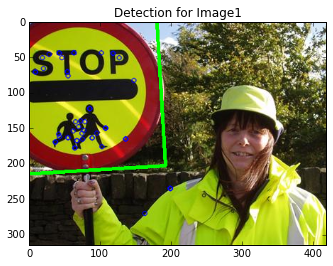

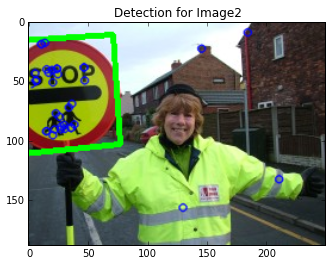

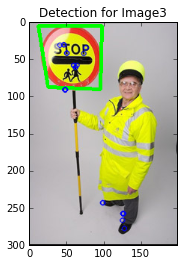

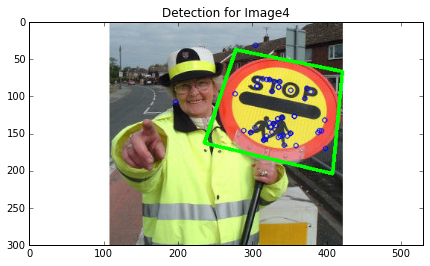

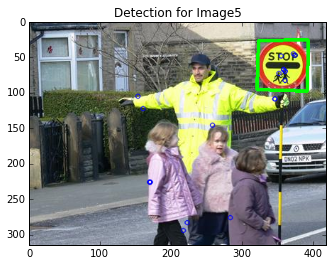

...

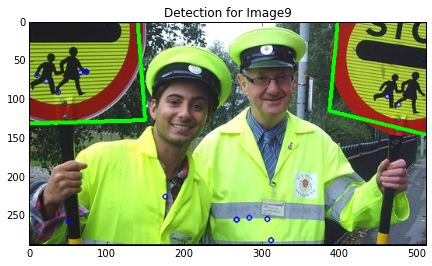

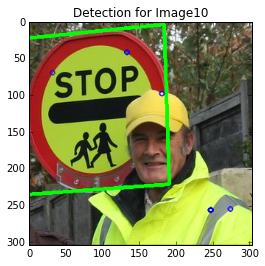

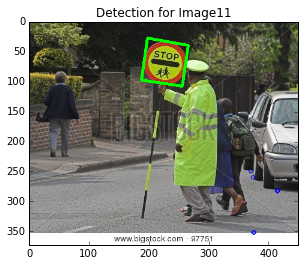

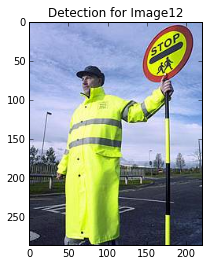

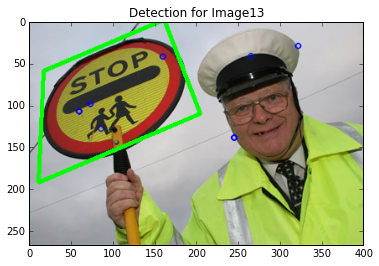

In [560]:
display_matches2("Roadsign", 1, 14)

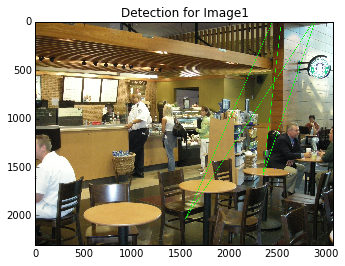

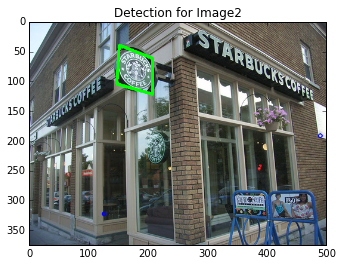

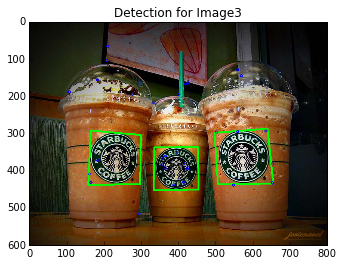

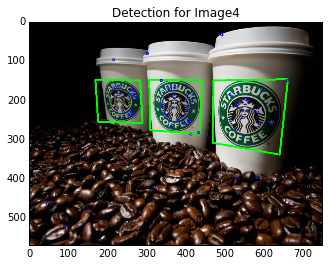

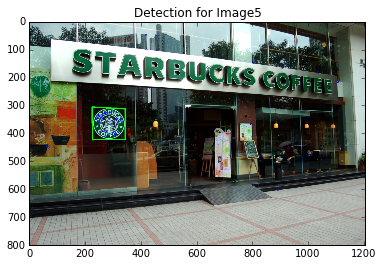

...

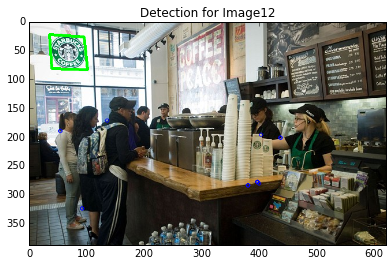

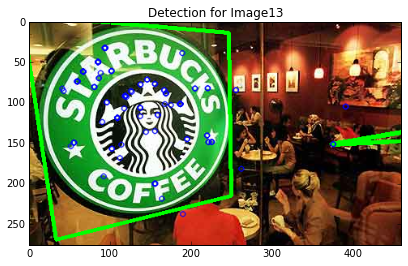

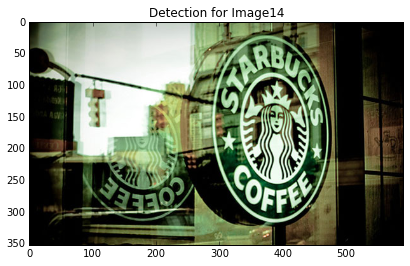

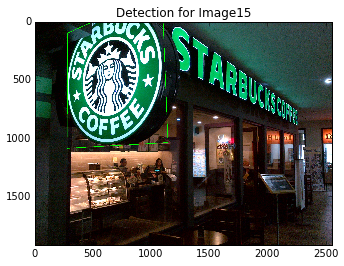

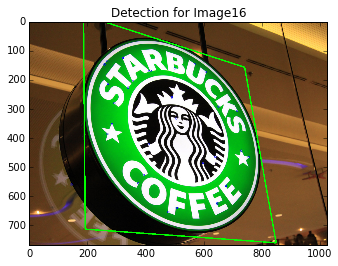

In [565]:
display_matches2("Starbucks", 1, 17)